# Fatal Car Accidents Project

* This project will predict the fatality car accident to determine if it involves a police pursuit or a pedestrian.

* The Categorical Bayes Classifier predicts if the fatality involves a police pursuit.

* KModes Clustering predicts the circumstancecs that leads to a pedestrian fatality.

## What is the dataset? JR

* The dataset is the Fatality Analyst Reporting System Auxiliary Dataset (FARS Auxiliary). The dataset is made up of three CSV files that are direct one-to-one mappings of the information found in the FARS dataset Accident, Vehicle and Person files and also contain new variables that were derived from variables in the original FARS dataset. The Accident file contains information about the accident itself, the Vehicle file contains information about the vehicle(s) involved in the accident and the Person file contains information about the person or people involved in the accident. The three CSV's were downloaded and imported seperately, then joined on the index variable ST_CASE.

* The dataset is comprised of all the fatalities on the road in America and indicate various circumstances involved in car crashes such as vehicle type, weather conditions, where on the road it occurred, etc. The FARS dataset is compiled yearly and includes all 50 states plus the Virgin Islands, Puerto Rico and the District of Columbia. The year of the dataset being used for this project is 2020.

* This dataset is mostly categorical values, all encoded as numerical. The only numeric variables are age, number of fatalities, the year of the vehicle(s) involved in the crash and the index variable ST_CASE.


## Setting the Environment JR

### Basic Environment
* Jupyter Notebook was exclusively used to build the code. 
* The cells are organized by the step process throughout the project

### Packages To Install

* I had to install folium, dython and kmodes using the pip3 command in the conda cmd before I could run this code. 

### Libraries Used
* Numpy
* Pandas
* Sklearn
* Dython
* Matplotlib
* Plotly
* Seaborn
* OS
* KModes

## Approach
* Extremely thorough investigation and cleaning of the data. 
* Every variable was looked up and individual decisions were made about every variable as far as imputation, deletion, and feature creation. 
* Since the majority of the data was categorical, I decided to use models that dealt with categorical variables. I used all of the categorical data, and removed the two features that were not categorical. 
* For descriptive statistics I also generated a correlation matrix designed specifically for categorical variables to help with data cleaning, imputation and feature engineering. 
* I chose a variety of graphs to visually describe the data since the usual descriptive statistics such as mean, and standard deviation would not make sense with categorical variables. 

In [171]:
"""Import Cell - Pip3 folium - scipy.stats.stats import pearsonr was deprecated - AR"""
#Packages To Pip3 For This To Work: folium, dython, kmodes

import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder 
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import CategoricalNB
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix

# Plotly Packages
from plotly import tools
#import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# Matplotlib and Seaborn
import matplotlib.pyplot as plt
import seaborn as sns
from string import ascii_letters
from matplotlib.patches import Patch

# Statistical Libraries
from scipy.stats import norm
from scipy.stats import skew
from scipy.stats import pearsonr
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
import folium
from folium.plugins import HeatMap
%matplotlib inline

#Library for relative path
import os

#Library for Imputation
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from numpy import isnan
from sklearn import preprocessing

#Dython imports for categorical correlation matrix
from dython.nominal import associations
from dython.nominal import identify_nominal_columns

#Library for KModes
from kmodes.kmodes import KModes




In [172]:
"""This cell will be used to import the data from the three excel files and link them via the case numbers - AR"""

#Found the explanation for how to use these functions here. 
#https://towardsthecloud.com/get-relative-path-python#:~:text=A%20relative%20path%20starts%20with,path%20to%20the%20file%20want.
#Takes the file name, finds the absolute path on someone's system and combines it with the relative path to load the csv into 
#a dataframe AMR
def relative_csv_to_dataframe(path):
    
    absolute_path = os.path.dirname(os.path.abspath(path))
    
    relative_path = path
    
    full_path = os.path.join(absolute_path, relative_path)
    
    dataFrame = pd.read_csv(full_path)
    
    return dataFrame

    
#Dataframe Variables Pre-Linked AMR
accident_df = relative_csv_to_dataframe("ACC_AUX.CSV")
vehicle_df = relative_csv_to_dataframe("VEH_AUX.CSV")
person_df = relative_csv_to_dataframe("PER_AUX.CSV")

#Set the index of the dataframes as ST_CASE
#This function did not actually change the dataframes until I turned inplace to true
#Figured this out using the API here
#https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.set_index.html AMR
accident_df.set_index('ST_CASE', inplace = True)
vehicle_df.set_index('ST_CASE', inplace = True)
person_df.set_index('ST_CASE', inplace = True)

#Put all three dataframes into a list for simpler passing to the join function AMR
dataFrameList = [vehicle_df, person_df]

#Links all three dataframes on the ST CASE attribute AMR
merged_df = accident_df.join(dataFrameList, lsuffix = '_accident', rsuffix = 'vehicle and person')



# Data Preparation and Data Cleaning JR

## Feature Removal and Row Removal

A_CrainJ is the crash injury type variable. A fatal crash is coded as 1, an estimated injury only crash is coded as 2, an estimated property damage only crash is coded as 3 and an estimated other crash is coded as 4. Since we are working on the FARS dataset which deals only with fatal crashes, we chose to remove this feature as it does not contribute to the model.

All of the FARS encoding manuals state that VEH_NO is an indexing variable for the VEH_AUX file. I don't think that is the case considering that the values are not consecutive and only seem to range from 0, to 15. However, I decided to remove this feature as redundant indexes are not necessary since the three dataframes are joined on ST_CASE. Additionally I removed VEH_NO_x as it is just a copy of VEH_NO.

A_D15_19, A_D15_20, A_D16_19, A_D16_20, A_D16_24, A_D21_24, and A_D65PLS are all different age ranges of young drivers and drivers over 65 years of age. These variables overlap and are redundant because there is an age group variable that does not overlap included in the dataset. Since the auxiliary dataset was created for the purpose of gaining information about specific data classifications, these overlapping young driver variables most likely exist for the purpose of researchers interested in those specific categories only. We removed these variables because the questions we are answering are not specific to those age ranges, are redundant and will potentially confuse the model and make it less effective.

A_DOW is the day of the week variable. It is divided into weekday, weekend or unknown. We decided to delete the unknowns instead of imputing them in this case since they represent only 0.10% of the total values for this feature.

A_INTER is a variable indicating whether a crash happened on an interstate or not. There are unknown values, but we are choosing to keep them since they may represent odd cases where neither interstate or not interstate were applicable. Additionally the unknowns for this feature account for 1.92% of the data.

A_INTSEC is a variable indicating whether a crash happened at an intersection or not. We decided to delete the unknowns instead of imputing them in this case since they represent only 0.18% of the total values for this feature.

A_JUNC is a variable indicating whether a crash happened at a junction or not. There are unknown values, but in this case there is also an other category. Since cases other than junctions are covered, the unknown values could be due to human error. Since the unknowns in this case make up only 0.18% of the data for this feature, we decided to delete them.

A_MANCOL is a variable indicating the manner of collision. There are unknown values that make up 0.37% of the overall data in this feature so we decided to remove them.

A_POSBAC is a variable indicating an accident involving a driver with a positive blood alcohol level. The percentage of unknowns for this feature is very high at 70.91%. For this reason we decided to impute the values for the unknowns in this category. Since they are essentially categorical, we are going to use the KNN (K nearest neighbors) imputation method.

A_RELRD is a variable indicating the crashes relationship to the road. The percentage of unknowns for this feature is only 0.18% so we decided to remove them.

A_ROADFC is a variable that indicates the roadway function where the crash occurred. The unknown observations account for 1.92% so we decided to impute them.

A_RU is a variable indicating if an accident happened in a rural or urban area. The unknown observations account for 1.08% of the feature so we decided to impute them.

A_TOD is a variable indicating the time of day a crash occurred. The unknown observations account for 0.36% of the observations in this feature so we decided to delete them.

A_BODY is a variable that indicates the body type of the vehicle involved in the accident. Other and unknown are combined into the same category, so even though it makes up 3.7% of the total values we think it would be unwise to impute or remove these.

A_CDL_S is a variable that indicates whether the accident involved a driver with a CDL, and what the status of the CDL was. The unknown observations account for 5.72% and will be imputed.

A_DRDIS is a variable that indicates a distracted driver or other. Since this is in the vehicle file, and not the accident file it is not repetitive data. I also compared the data values for both the accident and vehicle file and they do not match, which further proves this is not repetitive data. Distracted driver in the accident file might mean the distracted driver was the cause of the accident. Distracted driver in the vehicle file might mean only that the driver was distracted, not that the distraction was the cause of the accident. For these reasons I'm choosing to keep these data categories seperate.

A_DRDRO indicates whether a driver was drowsy or not. Similiar to the A_DRDIS variable, this one is also not repetitive. The values do not match in the accident set and this also most likely indicates this variable is a drowsy driver that was not the cause of the accident.

A_IMP1 indicates the initial impact point on a vehicle in a crash. The unknown observations account for 4.13% of the observations so we decided to impute them.

A_IMP2 is supposed to be a variable that indicates the principal impact point as well, but it is a blank field with no values and will be deleted.

A_LIC_C indicates whether the driver's license is compliant or not. The unknown values account for 5.9% of the observations and will be imputed.

A_LIC_S indicates whether the driver's license is valid or not. The unknown values account for 5.56% of the observations and will be imputed.

A_MC_L_S indicates whether the motorcycle driver's license is valid or not. The unknown values account for 0.23% so they will be deleted.

Once again there are 9 variables with age groups grouped differently. The total observations are the same, the groups are just different. Therefore the data is redundant and only one selection of age groups needs to be chosen. We deleted the others and chose to keep A_AGE6 as it gave the best range in ages, from less than 15, intervals of 4 or 5 and than 75+. The unknowns account for 2.58% and will be imputed as well.

A_ALCTES indicates alcohol testing results, and if the driver was tested for alcohol at all. Again, this is not redundant data and may be simply alcohol data related to the driver but not necessarily thought to be the cause of the crash. Unknowns for this variable make up 16.12% of the observations and will be imputed.

A_EJECT indicates whether people were ejected from a vehicle due to the crash. The unknowns make up 1.07% of the observations and will be imputed.

A_HELMUSE indicates whether a person involved in an accident presumably involving a motorcycle/bicycle was wearing a helmet or not. The unknowns make up 6.46% of the observations and will be imputed.

A_HISP indicates whether a person is hispanic or not. Unknowns in this case could matter, as it could indicate a desire of the person to be non-responsive. For this reason, though the unknowns are significant, we decided to leave them in.

A_HRACE indicates what race a person is. Unknowns in this case could also matter as it could indicate unresponsiveness to the question. For this reason, though the unknowns are significant, we decided to leave them in.

A_LOC indicates the location of a non-motorist involved in an accident. The unknowns in this case are combined with not reported which is important potentially for hit and run incidents. For this reason, we left the variable unimputed and not deleted.

A_PERINJ indicates the type of personal injury suffered in a crash. For this particular data set only two codings of this feature are applicable, 1 for fatal and 6 for survivor in fatal crash.

A_PTYPE indicates the type of person involved in the accident, i.e. driver, occupant, etc. Unknown, other and non occupants are all combined into one category so they will remain that way since other may point to findings to be later investigated.

A_RCAT indicates race using OMB guidelines. The unknowns in this one will stay since they could indicate the desire to not respond to the question.

A_RESTUSE indicates whether a restraint (presumably a seatbelt) was used during the crash. The unknowns represent 15.14% of all the observations and will be imputed.

YEAR_x, YEAR_y are variables representing the year the accidents occurred. Since the dataset we are working with is all from the year 2020, we removed this variable as it is unnecessary and redundant.

PER_NO is a variable used to number each person involved in a crash. This variable is redundant since the CSV files are already linked via the ST_CASE variable and will be deleted.

A_WEATHER is a variable indicating the weather conditions when the crash occurred. The unknown values account for 6.72% of the data for this feature and will be imputed.

A_PEDAL_F, A_VRD, A_PED_F are variables that I could not find in any of the manuals or documentation. Therefore, since it is a complete unknown I am removing it.

BIA, SPJ_INDIAN and INDIAN_RES indicate whether a crash happened on tribal lands, an indian reservation or either respectively. I chose to delete the first two and keep the last as the first two are redundant, and the third offers the most complete data.

A_MOD_YR is a variable indicating the make and model of the car in the accident. The unknowns for this variable account for 2.43% and will be imputed.

A_DOA indicates whether a person died at the scene of the accident or on the way to the hospital. The numbers used to encode the data do not match what is in any of the manuals, including the most recent one that is supposed to be for the 2020 dataset. Since we already have a fatalities variable anyway, and without knowing what the codes stand for, we decided to delete it.

## Imputation

KNN (K Nearest Neighbors Imputation Method)

KNN is itself a prediction model. It uses prediction based on the other features to predict what the missing values may be and replaces them. From our research it seemed to be generally effective with categorical variables encoded as numbers, which the entirety of the dataset is. We also chose it because it did not require one hot encoding, so it simplified the data pre-processing in that regard while still maintaining effectiveness.

Steps Missing values must be marked with NaN values. This is because the function looks for NaN values to replace, and I could not find a way to change this. So we must change the unknown values we want to replace in each column, with NaN.

Create a modeling pipeline so that the data that gets imputed is only on the training set, not the test set. This is important to prevent data leakage. Data leakage is when the training data gets "leaked" into the testing data.

However, the time complexity for this imputation method is O(n^2) unfortunatley and I had to use the Iterative Imputer instead.

Unknowns that made up more than 1% of the observations for a given feature were imputed. If unknowns made up less than 1% of the observations for a given feature the rows were deleted. 

In [178]:
""" Data validation cell and preliminary descriptive stats AMR""" 
#Data Validation Area
#merged_df.info(verbose = True)

#Graph every feature and print the percentage of unknowns they have
for column in merged_df:
    # Calculating percentage
    result = (merged_df[column].value_counts()/len(merged_df)*100)
    # Display result
    print(f"Percentage of {column} Column:\n",result)




#Graph to visualize data. Used the API here. I used this to visualize each feature individually to verify the values
#https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html
plt.hist(merged_df['A_MC_L_S'], bins = [1, 1.1, 2, 2.1, 3, 3.1, 4, 4.1, 5, 5.1, 6, 6.1, 7, 7.1], align = 'left')


#Print all the unknowns for all the features. 
#Counts the number of observations for each attribute
#Found the code for this here.
#https://www.marsja.se/pandas-count-occurrences-in-column-unique-values/#:~:text=To%20count%20the%20number%20of%20occurrences%20in%20e.g.%20a%20column,in%20the%20column%20%E2%80%9Ccondition%E2%80%9D.
column_observations = merged_df['A_RCAT'].value_counts()
column_observations2 = merged_df['A_AGE6'].value_counts()


print("The variable counts are:")
print(column_observations)
#print(column_observations2)

#Returns the sum of all the observations for a given column
total_column_observations = sum(merged_df['A_RCAT'].value_counts())
#total_column_observations2 = sum(merged_df['A_AGE2'].value_counts())

print("The total number of observations for this feature are:")
print(total_column_observations)
#print(total_column_observations2)

#The unknown column counts divided by the total observations for that feature
percent_unknown = ((column_observations[0] + column_observations[8])/total_column_observations)
#percent_unknown2 = (column_observations2[2]/total_column_observations2)



#Prints the percentage that the unknown values are of the entire dataset. 
print("The percentage of unknowns for this feature are:")
print(f"{percent_unknown: .2%}")

Percentage of YEAR_x Column:
 2020    100.0
Name: YEAR_x, dtype: float64
Percentage of STATE Column:
 48    10.412817
6      9.960785
12     9.163613
13     4.550577
37     3.898930
47     3.244065
39     3.208649
17     3.099827
26     2.986497
42     2.859645
4      2.783662
36     2.709612
29     2.510641
45     2.498406
1      2.419848
18     2.347085
51     2.121714
22     2.092093
21     1.972324
8      1.879600
40     1.669038
28     1.606578
34     1.545406
24     1.491961
53     1.425637
55     1.410827
5      1.405032
41     1.233749
20     0.970386
35     0.965235
27     0.915009
32     0.908570
25     0.862852
19     0.786869
9      0.739219
49     0.720546
54     0.611079
16     0.587254
31     0.529302
56     0.382488
30     0.374117
23     0.352224
46     0.297491
10     0.287188
33     0.249197
38     0.212493
15     0.195108
2      0.173858
44     0.165487
50     0.117193
11     0.088217
Name: STATE, dtype: float64
Percentage of COUNTY Column:
 37     2.868016
31     2

In [179]:
""" Data Deleting Cell: Data will be deleted in this cell. AMR"""

#Delete section. Took these commands from Naive Bayes Assignment AMR

merged_df.drop(columns = ['A_CRAINJ', 'VEH_NO_y', 'A_D15_19', 'A_D15_20', 'A_D16_19' ,'A_D16_20', 'A_D16_24', 'A_D21_24' ,'A_D65PLS', 'A_IMP2', 'A_AGE1',
'A_AGE2' ,'A_AGE3' ,'A_AGE4' ,'A_AGE5' ,'A_AGE7' ,'A_AGE8' ,'A_AGE9', 'PER_NO', 'A_PEDAL_F', 'A_VRD', 'A_PED_F', 'BIA', 'SPJ_INDIAN', 'YEAR_y', 'VEH_NO_x',
'YEAR_x', 'YEAR', 'A_DOA', 'A_RCAT', 'A_HISP', 'A_JUNC'], axis = 1, inplace = True) 

#Drop the rows with unknown values that are less than 1% of the data for that feature
merged_df = merged_df[(merged_df.A_DOW != 3) & (merged_df.A_INTSEC !=3) & (merged_df.A_MANCOL != 7) & (merged_df.A_RELRD != 6) 
& (merged_df.A_TOD != 3) & (merged_df.A_MC_L_S != 3)]
                      
merged_df.info()

total_column_observations3 = sum(merged_df['A_DOW'].value_counts())

print(merged_df)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 153620 entries, 10001 to 560115
Data columns (total 49 columns):
 #   Column      Non-Null Count   Dtype
---  ------      --------------   -----
 0   STATE       153620 non-null  int64
 1   COUNTY      153620 non-null  int64
 2   FATALS      153620 non-null  int64
 3   A_REGION    153620 non-null  int64
 4   A_RU        153620 non-null  int64
 5   A_INTER     153620 non-null  int64
 6   A_RELRD     153620 non-null  int64
 7   A_INTSEC    153620 non-null  int64
 8   A_ROADFC    153620 non-null  int64
 9   A_MANCOL    153620 non-null  int64
 10  A_TOD       153620 non-null  int64
 11  A_DOW       153620 non-null  int64
 12  A_CT        153620 non-null  int64
 13  A_WEATHER   153620 non-null  int64
 14  A_LT        153620 non-null  int64
 15  A_MC        153620 non-null  int64
 16  A_SPCRA     153620 non-null  int64
 17  A_PED       153620 non-null  int64
 18  A_PEDAL     153620 non-null  int64
 19  A_ROLL      153620 non-null  int64
 20  

In [180]:

""" Data Imputation and Reformatting After Imputation Cell AMR"""

"""Replacing Values With NaN"""
#Replace all the unknown values with NaN for imputation.
#Pass it the dataframe, list of columns you want to re-code and the values unknowns are coded as
def unknown_to_NaN(dataframe, unknown_list, unknown_coding):
    for feature in unknown_list:
       dataframe.replace({feature: {unknown_coding: np.nan}}, inplace = True)
       #print(merged_df[feature])
        
#Changes all unknowns coded as 3 to NaN        
unknown_to_NaN(merged_df, ['A_INTER', 'A_POSBAC', 'A_RU', 'A_CDL_S', 'A_LIC_C', 'A_LIC_S', 'A_EJECT', 'A_HELMUSE', 'A_RESTUSE'], 3)
        
#Changes unknown coded as 7 to NaN
unknown_to_NaN(merged_df, ['A_ROADFC'], 7)

#Changes unknown coded as 10 to NaN
unknown_to_NaN(merged_df, ['A_AGE6'], 10)

#Changes unknown coded as 5 to NaN
unknown_to_NaN(merged_df, ['A_ALCTES'], 5)

#Changes unknown coded as 99 to NaN
unknown_to_NaN(merged_df, ['A_WEATHER'], 99)

#Changes Unknown and Not Applicable Coded as 0, and 9 to NaN
unknown_to_NaN(merged_df, ['A_HRACE'], 0)
unknown_to_NaN(merged_df, ['A_HRACE'], 9)

#Validate NaNs were actually replaced
print(merged_df['A_WEATHER'].value_counts(dropna = False))

"""Saving Variables For Renaming Area: Since imputation strips all the column names and the index from the dataframe, even when converted back, I need to save the names
of the columns and the index as lists so I can rename them after"""
#Save column values
column_header = list(merged_df.columns.values)
#print(column_header)

#Save Index Values. Found that this was a faster function for large dataframes here. 
#https://www.statology.org/pandas-index-to-list/
index_list = merged_df.index.values.tolist()
#print(index_list)

"""Imputation Area"""

#Imputation using iterative imputer. Found in API Here. 
#https://scikit-learn.org/stable/modules/impute.html
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(numpy_data)
IterativeImputer(random_state=0)
imputed_numpy_array = (np.round(imp.transform(numpy_data)))
imputed_df = pd.DataFrame(imputed_numpy_array)
print(imputed_df)

print('Missing: %d' % sum(isnan(imputed_numpy_array).flatten()))
print('Missing: %d' % sum(isnan(imputed_numpy_array).flatten())) 

#Put the column names and indexes back on the dataframe. 
imputed_df.columns = column_header
imputed_df.index = index_list

#Change the datatype back to int64. Depending on the models we use, we may need to change this datatype again but since the variables are categorical 
#I did not want them treated as floating point numbers in any model most likely. 
rfi_df = imputed_df.astype('int64').dtypes
print(rfi_df.dtypes)

#Graph every feature and print the percentage of unknowns they have
for column in merged_df:
    # Calculating percentage
    result = (merged_df[column].value_counts()/len(merged_df)*100)
    # Display result
    print(f"Percentage of {column} Column:\n",result)


          0     1    2    3    4    5    6    7    8    9   ...   39   40  \
0        1.0  51.0  3.0  4.0  1.0  2.0  4.0  2.0  5.0  1.0  ...  1.0  3.0   
1        1.0  51.0  3.0  4.0  1.0  2.0  4.0  2.0  5.0  1.0  ...  1.0  3.0   
2        1.0  51.0  3.0  4.0  1.0  2.0  4.0  2.0  5.0  1.0  ...  1.0  3.0   
3        1.0  51.0  3.0  4.0  1.0  2.0  4.0  2.0  5.0  1.0  ...  1.0  3.0   
4        1.0  73.0  1.0  4.0  2.0  2.0  1.0  2.0  4.0  4.0  ...  1.0  5.0   
...      ...   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
153615  56.0  21.0  1.0  8.0  2.0  2.0  1.0  2.0  3.0  5.0  ...  1.0  2.0   
153616  56.0  21.0  1.0  8.0  2.0  2.0  1.0  2.0  3.0  5.0  ...  1.0  2.0   
153617  56.0  21.0  1.0  8.0  2.0  2.0  1.0  2.0  3.0  5.0  ...  1.0  3.0   
153618  56.0  31.0  1.0  8.0  1.0  1.0  1.0  2.0  1.0  1.0  ...  1.0  9.0   
153619  56.0  31.0  1.0  8.0  1.0  1.0  1.0  2.0  1.0  1.0  ...  1.0  8.0   

         41   42   43   44   45   46   47   48  
0       1.0  2.0  2.0  2.0

# Descriptive Statistics JR

## Automobile Fatalities by State

* This graph shows the automobile fatalities by state. The larger states in the United States are shown to have more fatalitites in 2020. The top three states are Texas, California and Florida. Texas is at the high of approximately 16000. The line increases or decreases depending on the number of fatalities. Over 108,000 fatalities occur in clear weather. This starts to create ideas of why so many accidents in clear weather. What is a factor to all of these fatalities especially in the bigger and more populated states.

## Number of People Killed Per Crash By Region and Rural/Urban Areas
 * This graph is very interesting because every state has fatal accidents in the urban area but not every state has fatal accidents in rural areas. According to this graph, more people in one car accident have died compared to the urban accidents. The minimum rural accident had 4 people died per car accident and the maximum amount of people that have died is 8 per crash. This is interesting because you would think busier areas would have more people die per accident compared to smaller areas. More people have died per accident in rural areas but there are far way more accidents in urban areas. The darker the color the more frequent the accident occurs. For example the AL, FL, GA, SC and TN region has a dark green color in the urban area so one casualtie per accident occurs very often. Regions in CO, NV, ND, SD WY and UT frequently have 8 casualties per accident.
 
## Intersection

* This shows the causalties that are not at an intersection majority happen off roadway/shoulder. Causalties at intersections happen about half of the time on roadway. The only collision that is off roadway/shoulder no matter if it's at an intersection or not is the collision with stopped vehicle.

## Weather and Speeding

* Shockingly in the weather and speeding graph shows that people that were not speeding has been in more fatal accidents compared to speeding in every weather condition. You would assume people that speed would cause more fatalities. When the weather is clear there are more fatalities then all of the different types of weather combined. I am assuming that this is accurate because there are more clear days compared to any type of weather. For an example, in south Texas majority of the weather is clear warm/hot. You'll see cloudy and rainy days but not as often as a clear sky.

## Pedestrians Hit By Drowsy Drivers

* The pink color represents pedestrians that are hit by drowsy drivers. The purple color represents pedestrians that are not hit. More pedestrians are hit at night time with approimately 15000 fatal accidents compared to day time with approximately at 5000 fatal deaths. Over 70000 fatal accidents occur in the daytime with non pedestrians. At night time approximately 60000 of fatal accidents happen with non pedestrians. Drowsy drivers visual sensory are affected due to any substance that causes them to be drowsy. They driver won't be able to see as clear and that is very dangerous for people outside of the drowsy driver's vehicle.

## Police Pursuit By Race

* According to this chart it shows that the white race are not involved in a police pursuit cause the most fatal accidents with a high of 80000. Asians come in second with approximately 55000 fatal accidents. Hispanics come in third with approximately 10000. The other colors can be a little hard to tell apart so I believe that there's a partial flaw with the colors we chose to keep them apart.

Clear                              108630
Unknown                             20063
Rain                                13524
Sleet/Hail                           6523
Snow                                 3145
Severe Crosswinds                    1417
Cloudy                                210
Freezing Rain or DrizzleUnknown        73
Blowing Snow                           18
Fog/Smog/Smoke                         17
Name: A_WEATHER, dtype: int64


<AxesSubplot:title={'center':'Cop Chase By Race'}, xlabel='A_POLPUR', ylabel='Count'>

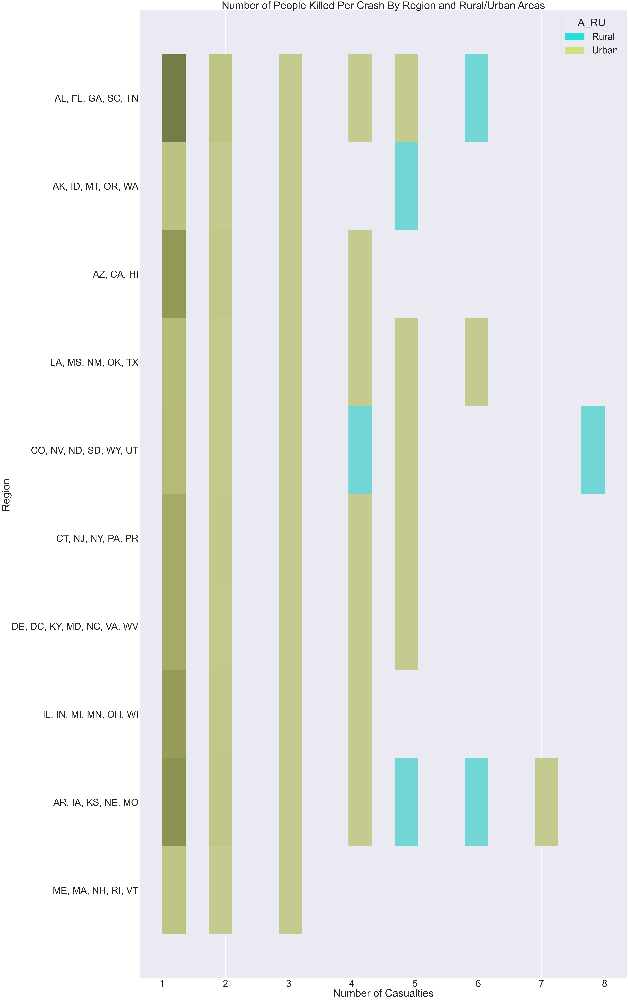

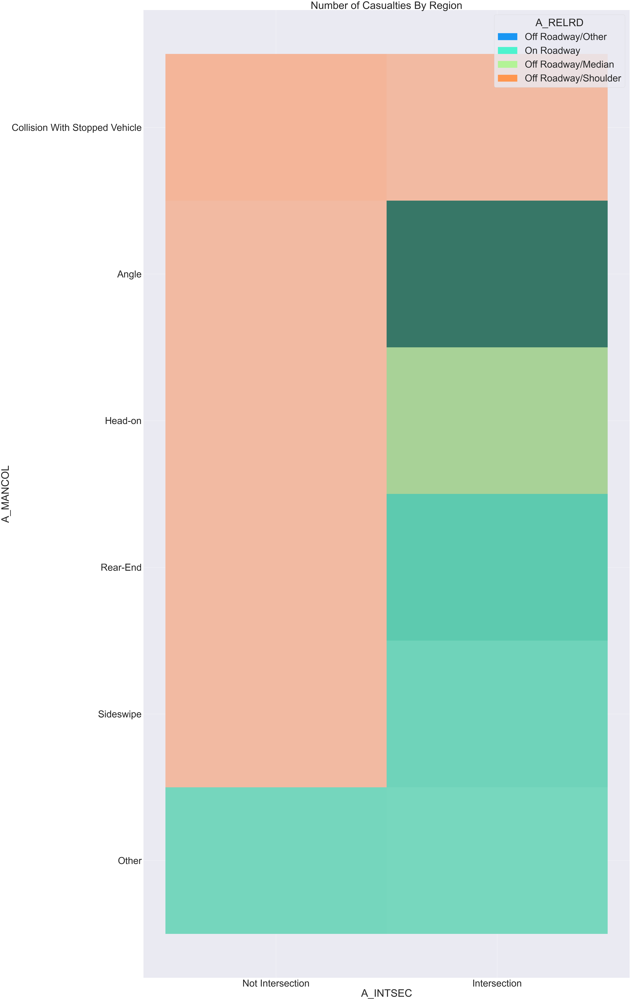

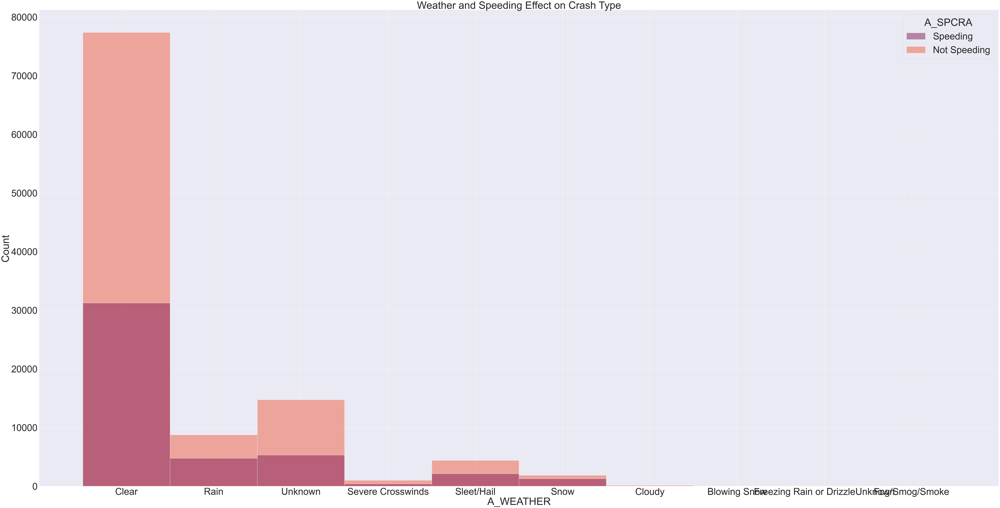

In [181]:

"""Descriptive Statistics Cell AMR"""
def numbers_to_names(number_codes, names, dataframe, column_to_recode):
    dataframe[column_to_recode].replace(to_replace = number_codes, value = names, inplace = True)
    

#Histplot of State Fatalities

#List of Labels for State Fatalities Graph
x_labels = ['AL','AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'D.C.', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 
'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 
'VT', 'V.I.', 'VA', 'WA', 'WV', 'WI', 'WY']
  

#Recode Dataframe Data For Display Purposes ONLY
pretty_df = imputed_df['STATE'].replace(to_replace = [0, 1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56], value = x_labels)

#print(pretty_df.value_counts())


#I found how to change the figure size here.
#https://stackoverflow.com/questions/58352904/how-to-change-the-dimensions-of-a-histogram-depicted-by-plt-hist-as-figsize-is
sns.set(font_scale = 5)
plt.figure(figsize=(100,100))
plt.title("Automobile Fatalities By State") 


sns.histplot(data = pretty_df, bins = 56, kde = True, color = 'r', line_kws = {'lw':15}) 
plt.savefig("Graph1.jpg")


plt.show()
plt.close()


#Type of Fatalities By County/Region and Rural/Urban Areas

#Labels for X Axis
x_labels = ['ME, MA, NH, RI, VT', 'CT, NJ, NY, PA, PR', 'DE, DC, KY, MD, NC, VA, WV', 'AL, FL, GA, SC, TN', 'IL, IN, MI, MN, OH, WI', 'AR, IA, KS, NE, MO', 'LA, MS, NM, OK, TX',
'CO, NV, ND, SD, WY, UT', 'AZ, CA, HI', 'AK, ID, MT, OR, WA']

#Copy only the variables I need for the graph. Since the dataset is so large this is the best way I could come up with for graphing things that were relevent. 

pretty_df2 = pd.DataFrame(imputed_df[['A_RU', 'A_REGION', 'FATALS']].copy(deep = True))

#Recode Dataframe Data For Display Purposes ONLY
pretty_df2['A_REGION'].replace(to_replace = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], value = x_labels, inplace = True)

#List To Recode For A_RU
ru_num_recode = [1, 2]
ru_string_recode = ['Rural', 'Urban']
numbers_to_names(ru_num_recode,ru_string_recode, pretty_df2, 'A_RU',)

#Actual Graph and Formatting
sns.set(font_scale = 5)
plt.figure(figsize=(50,100))
plt.title("Number of People Killed Per Crash By Region and Rural/Urban Areas")
sns.histplot(data = pretty_df2, y = 'A_REGION', x = 'FATALS', palette = 'rainbow', hue = 'A_RU') 
plt.savefig("Graph2.jpg")

#Places on the Road and What Types of Collisions Occur Histplot

#Copy Necessary Variables Into a new dataframe
pretty_df3 = pd.DataFrame(imputed_df[['A_INTER', 'A_INTSEC', 'A_MANCOL', 'A_RELRD', 'A_ROADFC']].copy(deep = True))

#Lists for Recoding
#Interstate
inter_num_recode = [1, 2]
inter_string_recode = ['Interstate', 'Not Interstate']

#Intersection
intsec_num_recode = [1, 2]
intsec_string_recode = ['Intersection', 'Not Intersection']

#Manner of Collision
mancol_num_recode = [1, 2, 3, 4, 5, 6]
mancol_string_recode = ['Collision With Stopped Vehicle', 'Rear-End', 'Head-on', 'Angle', 'Sideswipe', 'Other']

#Relationship To Road
relrd_num_recode = [1, 2, 3, 4, 5]
relrd_string_recode = ['On Roadway', 'Off Roadway/Shoulder', 'Off Roadway/Median', 'Off Roadway/Other', 'Off Roadway (No other details)']

#Roadway Function
roadfc_num_recode = [1, 2, 3, 4, 5, 6]
roadfc_string_recode = ['Interstate, principal arterial', 'Freeway and expressway, principal arterial', 'Principal arterial, other', 'Minor arterial', 'Collector', 'Local']

#Recode Variables
numbers_to_names(inter_num_recode,inter_string_recode, pretty_df3, 'A_INTER')
numbers_to_names(intsec_num_recode,intsec_string_recode, pretty_df3, 'A_INTSEC')
numbers_to_names(mancol_num_recode,mancol_string_recode, pretty_df3, 'A_MANCOL')
numbers_to_names(relrd_num_recode,relrd_string_recode, pretty_df3, 'A_RELRD')
numbers_to_names(roadfc_num_recode,roadfc_string_recode, pretty_df3, 'A_ROADFC')

#print(pretty_df3['A_ROADFC'])
#print(pretty_df3['A_ROADFC'].value_counts())

#Where Types of Accidents Occurred
#Actual Graph and Formatting
plt.ylabel("Region")
plt.xlabel("Number of Casualties")
#legend = plt.legend(handles = ["Rural", "Urban"], title="Rural or Urban", loc=4, fontsize='small', fancybox=True)
sns.set(font_scale = 5)
plt.figure(figsize=(50,100))
plt.title("Number of Casualties By Region")
sns.histplot(data = pretty_df3, y = 'A_MANCOL', x = 'A_INTSEC', palette = 'rainbow', hue = 'A_RELRD') 


#Weather, Crash Type and Speeding Graph

#Copy Necessary Variables Into a new dataframe
pretty_df4 = pd.DataFrame(imputed_df[['A_WEATHER', 'A_CT', 'A_SPCRA']].copy(deep = True))

#Lists for Recoding

#Weather
weather_num_recode = [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15]
weather_string_recode = ['Clear', 'Rain', 'Sleet/Hail', 'Snow', 'Fog/Smog/Smoke', 'Severe Crosswinds', 'Blowing Sand/Soil/Dirt', 'Other', 'Cloudy', 'Blowing Snow', 'Freezing Rain or Drizzle'
'Unknown', 'Unknown', 'Unknown', 'Unknown']

#Crash Type
crash_num_recode = [1, 2, 3]
crash_string_recode = ['Single Vehicle', 'Two Vehicle', 'More Than Two Vehicles']

#Speeding
speeding_num_recode = [1, 2]
speeding_string_recode = ['Speeding', 'Not Speeding']

#Recode Variables
numbers_to_names(weather_num_recode,weather_string_recode, pretty_df4, 'A_WEATHER')
numbers_to_names(crash_num_recode,crash_string_recode, pretty_df4, 'A_CT')
numbers_to_names(speeding_num_recode,speeding_string_recode, pretty_df4, 'A_SPCRA')

print(pretty_df4['A_WEATHER'].value_counts())

#Actual Graph and Formatting
sns.set(font_scale = 5)
plt.figure(figsize=(100,50))
plt.title("Weather and Speeding Effect on Crash Type")
sns.histplot(data = pretty_df4, x = 'A_WEATHER', palette = 'rocket', hue = 'A_SPCRA')
plt.savefig("Graph3.jpg")

#Time of Day and Pedestrian Graph
#Copy Necessary Variables Into a new dataframe
pretty_df5 = pd.DataFrame(imputed_df[['A_TOD', 'A_PED', 'A_DROWSY']].copy(deep = True))

#Lists for Recoding

#Time of Day
tod_num_recode = [1, 2]
tod_string_recode = [ 'Daytime', 'Nighttime']

#Pedestrian
ped_num_recode = [1, 2]
ped_string_recode = [ 'Pedestrian', 'Not Pedestrian']

#Drowsy Driver
drow_num_recode = [1, 2]
drow_string_recode = [ 'Drowsy', 'Not Drowsy']

#Recode Variables
numbers_to_names(tod_num_recode,tod_string_recode, pretty_df5, 'A_TOD')
numbers_to_names(ped_num_recode,ped_string_recode, pretty_df5, 'A_PED')
numbers_to_names(drow_num_recode,drow_string_recode, pretty_df5, 'A_DROWSY')

#Actual Graph and Formatting
sns.set(font_scale = 5)
plt.figure(figsize=(200,50))
plt.title("When Do Pedestrians Get Hit By Drowsy Drivers")
sns.histplot(data = pretty_df5, x = 'A_TOD', palette = 'rocket', hue = 'A_PED')
plt.savefig("Graph4.jpg")

#Police Chase and Race
#Copy Necessary Variables Into a new dataframe
pretty_df6 = pd.DataFrame(imputed_df[['A_POLPUR', 'A_HRACE', 'A_BODY']].copy(deep = True))

#Lists for Recoding

#Police Chase
pol_num_recode = [1, 2]
pol_string_recode = [ 'Police Pursuit', 'No Police Pursuit']

#Race
race_num_recode = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
race_string_recode = [ 'Not Applicable', 'Hispanic', 'White', 'Black', 'American Indian', 'Asian', 'Pacific Islander', 'Mixed Race', 'All Other Races', 
'Unknown']

#Recode Variables
numbers_to_names(pol_num_recode,pol_string_recode, pretty_df6, 'A_POLPUR')
numbers_to_names(race_num_recode,race_string_recode, pretty_df6, 'A_HRACE')


#Actual Graph and Formatting
sns.set(font_scale = 5)
plt.figure(figsize=(200,50))
plt.title("Cop Chase By Race")
sns.histplot(data = pretty_df6, x = 'A_POLPUR', hue = 'A_HRACE')


In [182]:
"""Correlation Matrix Cell Using Dython AR"""


#Make a Copy of the DataFrame. This DataFrame Will Have All Numbers Coded As The Categories They Represent
cat_df = pd.DataFrame(imputed_df.copy(deep = True))

#Drop the County Column. Though It is Categorical, the values are numeric and there are 900 of them. I do not know of a faster way to re-encode the variables properly so I am 
#Dropping it from the correlation matrix
#I am also dropping FATALS because it is a numeric value (Number of fatalities)
#Dropping year of vehicle because it is also numeric
cat_df.drop(columns = ['COUNTY', 'FATALS', 'A_MOD_YR'], inplace = True)

#print(cat_df)

#Recode Variables

#State (I know this is a repeated variable but I just wanted all the lists I am using to recode in the same cell for easy reference)
state_num_recode = [0, 1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
state_string_recode = ['AL','AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'D.C.', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 
'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 
'VT', 'V.I.', 'VA', 'WA', 'WV', 'WI', 'WY']

#Region
region_num_recode = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
region_string_recode = ['ME, MA, NH, RI, VT', 'CT, NJ, NY, PA, PR', 'DE, DC, KY, MD, NC, VA, WV', 'AL, FL, GA, SC, TN', 'IL, IN, MI, MN, OH, WI', 'AR, IA, KS, NE, MO', 'LA, MS, NM, OK, TX',
'CO, NV, ND, SD, WY, UT', 'AZ, CA, HI', 'AK, ID, MT, OR, WA']

#Rural or Urban
ru_num_recode = [1, 2]
ru_string_recode = ['Rural', 'Urban']

#Interstate
inter_num_recode = [1, 2]
inter_string_recode = ['Interstate', 'Not Interstate']

#Relationship To Trafficway
relrd_num_recode = [1, 2, 3, 4, 5]
relrd_string_recode = ['On Roadway', 'Off Roadway/Shoulder', 'Off Roadway/Median', 'Off Roadway/Other', 'Off Roadway (No other details)']

#Intersection
intsec_num_recode = [1, 2]
intsec_string_recode = ['Intersection', 'Not Intersection']

#Roadway Function
roadfc_num_recode = [1, 2, 3, 4, 5, 6]
roadfc_string_recode = ['Interstate, principal arterial', 'Freeway and expressway, principal arterial', 'Principal arterial, other', 'Minor arterial', 'Collector', 'Local']

#Manner of Collision
mancol_num_recode = [1, 2, 3, 4, 5, 6]
mancol_string_recode = ['Collision With Stopped Vehicle', 'Rear-End', 'Head-on', 'Angle', 'Sideswipe', 'Other']

#Time of Day
tod_num_recode = [1, 2]
tod_string_recode = [ 'Daytime', 'Nighttime']

#Day of the Week
dow_num_recode = [1, 2]
dow_string_recode = ['Weekday', 'Weekend']

#Crash Type
crash_num_recode = [1, 2, 3]
crash_string_recode = ['Single Vehicle', 'Two Vehicle', 'More Than Two Vehicles']

#Weather
weather_num_recode = [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15]
weather_string_recode = ['Clear', 'Rain', 'Sleet/Hail', 'Snow', 'Fog/Smog/Smoke', 'Severe Crosswinds', 'Blowing Sand/Soil/Dirt', 'Other', 'Cloudy', 'Blowing Snow', 'Freezing Rain or Drizzle'
'Unknown', 'Unknown', 'Unknown', 'Unknown']

#Large Truck
lt_num_recode = [1, 2]
lt_string_recode = ['Large Truck Involved', 'No Large Truck Involved']

#Motorcycle
mc_num_recode = [1, 2]
mc_string_recode = ['Motorcycle Involved', 'No Motorcycle Involved']

#Speeding
speeding_num_recode = [1, 2]
speeding_string_recode = ['Speeding', 'Not Speeding']

speeding2_num_recode = [1, 2]
speeding2_string_recode = ['Speeding', 'Not Speeding']

#Pedestrian
ped_num_recode = [1, 2]
ped_string_recode = [ 'Pedestrian', 'Not Pedestrian']

#Bicycle
bike_num_recode = [1, 2]
bike_string_recode = ['Bicycle Involved', 'No Bicycle Involved']

#Vehicle Rollover
roll_num_recode = [1, 2]
roll_string_recode = ['Vehicle Rollover', 'No Vehicle Rollover']

roll2_num_recode = [1, 2]
roll2_string_recode = ['Vehicle Rollover', 'No Vehicle Rollover']

#Police Chase
pol_num_recode = [1, 2]
pol_string_recode = [ 'Police Pursuit', 'No Police Pursuit']

#Positive Blood Alcohol Test
bac_num_recode = [0, 1, 2, 3]
bac_string_recode = ['Driver With Positive BAC Test', 'All Drivers with Zero BAC Test', 'Unknown', 'Unknown']

alc_num_recode = [1, 2, 3, 4]
alc_string_recode = ['No Alcohol', 'Positive BAC', 'Not Tested', 'Tested With Unknown Results']

#Roadway Departure
rd_num_recode = [1, 2]
rd_string_recode = ['Left Roadway', 'Did Not Leave Roadway']

#Hit and Run
hr_num_recode = [1, 2]
hr_string_recode = ['Hit and Run', 'Not a Hit and Run']

#Distracted Driver
dist_num_recode = [1, 2]
dist_string_recode = ['Distracted Driver', 'No Distracted Driver']

dist2_num_recode = [1, 2]
dist2_string_recode = ['Distracted Driver', 'No Distracted Driver']

#Drowsy Driver
drow_num_recode = [1, 2]
drow_string_recode = [ 'Drowsy', 'Not Drowsy']

drow2_num_recode = [1, 2]
drow2_string_recode = [ 'Drowsy', 'Not Drowsy']

#Indian Reservation
ind_num_recode = [1, 0]
ind_string_recode = ['On Indian Reservation', 'Not On Indian Reservation']

#Body Type of Vehicle
body_num_recode = [1, 2, 3, 4, 5, 6, 7, 8, 9]
body_string_recode = ['Passenger Car', 'Light Truck - Pickup', 'Light Truck - Utility', 'Light Truck - Van', 'Light Truck - Other', 'Large Truck'
, 'Motorcycle', 'Bus', 'Other/Unknown']

#Initial Impact Point
imp_num_recode = [1, 2, 3, 4, 5, 6, 7]
imp_string_recode = ['Non-Collision', 'Front', 'Right Side', 'Rear', 'Left Side', 'Other', 'Unknown']

#License Status
lics_num_recode = [1, 2, 4]
lics_string_recode = ['Valid', 'Not Valid', 'Not Applicable']

#License Compliance
licc_num_recode = [1, 2, 4]
licc_string_recode = ['Valid', 'Not Valid', 'Not Applicable']

#CDL Status
cdl_num_recode = [1, 2, 4]
cdl_string_recode = ['Valid', 'Not Valid', 'Not Applicable']

#Motorcycle License Status
motl_num_recode = [1, 2, 4]
motl_string_recode = ['Valid', 'Not Valid', 'Not Applicable']

#Involving a Bus
bus_num_recode = [1, 2, 3]
bus_string_recode = ['School Bus Body Type', 'Used As A School Bus', 'Other Body Type']

#Fire Occurred
fire_num_recode = [1, 2]
fire_string_recode = ['No Fire', 'Fire Occurred']

#Age Group
age_num_recode = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
age_string_recode = ['Unknown', 'Less Than 15 Yrs Old', '15 - 20 Yrs Old', '21 - 24 Yrs Old', '25 - 34 Yrs Old', '35 - 44 Yrs Old', '45 - 54 Yrs Old', '55 - 64 Yrs Old', '65 - 74 Yrs Old', 
'75 Yrs Old And Older']

#Person That Died
pers_num_recode = [1, 2, 3, 4, 5]
pers_string_recode = ['Driver', 'Occupant', 'Pedestrian', 'Pedalcyclist', 'Other/Unknown Occupants']

#Seatbelt Use
belt_num_recode = [1, 2]
belt_string_recode = ['Used Seatbelt', 'Did Not Use Seatbelt']

#Helmet Use
helm_num_recode = [1, 2]
helm_string_recode = ['Used Helmet', 'Did Not Use Helmet']

#Race
race2_num_recode = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
race2_string_recode = [ 'Not Applicable', 'Hispanic', 'White', 'Black', 'American Indian', 'Asian', 'Pacific Islander', 'Mixed Race', 'All Other Races', 
'Unknown']

#Ejected From Vehicle
eject_num_recode = [1, 2]
eject_string_recode = ['Not Ejected', 'Ejected']

#Survival Status
surv_num_recode = [1, 6]
surv_string_recode = ['Did Not Survive', 'Survived']

#Non Motorist Location
loc_num_recode = [1, 2, 3, 4, 5]
loc_string_recode = ['Occupant of Vehicle', 'Within An Intersection', 'Within Non Intersection', 'Other Location', 'Unknown or Not Reported']

#Call Function To Recode
numbers_to_names(state_num_recode,state_string_recode, cat_df, 'STATE')
numbers_to_names(region_num_recode, region_string_recode, cat_df, 'A_REGION')
numbers_to_names(ru_num_recode,ru_string_recode, cat_df, 'A_RU',)
numbers_to_names(inter_num_recode, inter_string_recode, cat_df, 'A_INTER')
numbers_to_names(relrd_num_recode, relrd_string_recode, cat_df, 'A_RELRD')
numbers_to_names(intsec_num_recode, intsec_string_recode, cat_df, 'A_INTSEC')
numbers_to_names(roadfc_num_recode, roadfc_string_recode, cat_df, 'A_ROADFC')
numbers_to_names(mancol_num_recode, mancol_string_recode, cat_df, 'A_MANCOL')
numbers_to_names(tod_num_recode, tod_string_recode, cat_df, 'A_TOD')
numbers_to_names(dow_num_recode, dow_string_recode, cat_df, 'A_DOW')
numbers_to_names(crash_num_recode, crash_string_recode, cat_df, 'A_CT')
numbers_to_names(weather_num_recode, weather_string_recode, cat_df, 'A_WEATHER')
numbers_to_names(lt_num_recode, lt_string_recode, cat_df, 'A_LT')
numbers_to_names(mc_num_recode, mc_string_recode, cat_df, 'A_MC')
numbers_to_names(speeding_num_recode, speeding_string_recode, cat_df, 'A_SPCRA')
numbers_to_names(speeding2_num_recode, speeding2_string_recode, cat_df, 'A_SPVEH')
numbers_to_names(ped_num_recode, ped_string_recode, cat_df, 'A_PED')
numbers_to_names(bike_num_recode, bike_string_recode, cat_df, 'A_PEDAL')
numbers_to_names(roll_num_recode, roll_string_recode, cat_df, 'A_ROLL')
numbers_to_names(roll2_num_recode, roll2_string_recode, cat_df, 'A_VROLL')
numbers_to_names(pol_num_recode, pol_string_recode, cat_df, 'A_POLPUR')
numbers_to_names(bac_num_recode, bac_string_recode, cat_df, 'A_POSBAC')
numbers_to_names(rd_num_recode, rd_string_recode, cat_df, 'A_RD')
numbers_to_names(hr_num_recode, hr_string_recode, cat_df, 'A_HR')
numbers_to_names(dist_num_recode, dist_string_recode, cat_df, 'A_DIST')
numbers_to_names(dist2_num_recode, dist2_string_recode, cat_df, 'A_DRDIS')
numbers_to_names(drow_num_recode, drow_string_recode, cat_df, 'A_DROWSY')
numbers_to_names(drow2_num_recode, drow2_string_recode, cat_df, 'A_DRDRO')
numbers_to_names(ind_num_recode, ind_string_recode, cat_df, 'INDIAN_RES')
numbers_to_names(body_num_recode, body_string_recode, cat_df, 'A_BODY')
numbers_to_names(imp_num_recode, imp_string_recode, cat_df, 'A_IMP1')
numbers_to_names(lics_num_recode, lics_string_recode, cat_df, 'A_LIC_S')
numbers_to_names(licc_num_recode, licc_string_recode, cat_df, 'A_LIC_C')
numbers_to_names(cdl_num_recode, cdl_string_recode, cat_df, 'A_CDL_S')
numbers_to_names(motl_num_recode, motl_string_recode, cat_df, 'A_MC_L_S')
numbers_to_names(bus_num_recode, bus_string_recode, cat_df, 'A_SBUS')
numbers_to_names(fire_num_recode, fire_string_recode, cat_df, 'A_FIRE_EXP')
numbers_to_names(age_num_recode, age_string_recode, cat_df, 'A_AGE6')
numbers_to_names(pers_num_recode, pers_string_recode, cat_df, 'A_PTYPE')
numbers_to_names(belt_num_recode, belt_string_recode, cat_df, 'A_RESTUSE')
numbers_to_names(helm_num_recode, helm_string_recode, cat_df, 'A_HELMUSE')
numbers_to_names(alc_num_recode, alc_string_recode, cat_df, 'A_ALCTES')
numbers_to_names(race2_num_recode, race2_string_recode, cat_df, 'A_HRACE')
numbers_to_names(eject_num_recode, eject_string_recode, cat_df, 'A_EJECT')
numbers_to_names(surv_num_recode, surv_string_recode, cat_df, 'A_PERINJ')
numbers_to_names(loc_num_recode, loc_string_recode, cat_df, 'A_LOC')

#Graphs For Weird Correlations
#Perinj and Race are only correlated at 1.00 because the majority of survivors are not applicable. 
#Actual Graph and Formatting
"""sns.set(font_scale = 5)
plt.figure(figsize=(50,50))
plt.title("Survivor and Race Correlation")
sns.histplot(data = cat_df, x = 'A_PERINJ', palette = 'coolwarm', hue = 'A_HRACE')"""

#print(cat_df.info)
#print(cat_df['A_LOC'].value_counts())
my_associations = associations(cat_df, figsize = (150, 150))

# Feature Engineering JR

We are using a correlation matrix to determin which features to compare or get rid of. The closer the number is to 1 the more correlated the two variables are. The closer the value is to 0 means there isn't any correlation. The values that are 1 means that they are very very similar and majority of the correlations are 1 are usually from the same variables, an example would be state and state. An example of two varaibles that don't correlate to one annother are A_SBUS and STATE with a correlation of 0.04. AN example that correlate with each other are A_BODY and A_MC_L_S with a correlation of 0.71. There's a diagonal tan line across the matrix that are highly correlated to each other. Variables that correlate with each orther can be combined together.
I am choosing to combine these features into one. They are measuring the same thing but the value counts are different so they are not repetitive variables. They are highly correlated with each other as well, indicating that combining them would not negatively impact the model and would increase efficiency as even after data cleaning there are still 50 features. 

* A_DROWSY combined with A_DRDRO (Drowsy Driver)
    The values do not match in the accident set and this also most likely indicates this variable is a drowsy driver that was not the cause of the accident. 

* A_SPVEH combined with A_SPCRA (Speeding)

* A_DIST combined with A_DRDIS (Distracted Driver)

    Since this is in the vehicle file, and not the accident file it is not repetitive data. I also compared the data values for both the accident and vehicle file and they do not match, which further proves this is not repetitive data. Distracted driver in the accident file might mean the distracted driver was the cause of the accident. Distracted driver in the vehicle file might mean only that the driver was distracted, not that the distraction was the cause of the accident. So I combined the two columns to make a new feature of all fatalities involving distracted driving. 

* A_ROLL combined with A_VROLL (Vehicle Rollover)

* A_ALCTES combined with A_POSBAC (Positive Blood Alcohol Test)
    This is not redundant data and may be simply alcohol data related to the driver but not necessarily thought to be the cause of the crash.
* A_PED combined with A_PEDAL (Pedestrians on Foot and Bicyclists)
    
    *We combined these two because pedestrian accidents weren't that high, and pedestrian safety and bicyclist safety are similiar enough for our model
    
I am also making a new variable called crash location that combines the variables below because they all together can give a better picture of a crash location instead of in individual True/False variables. 

* A_INTER (Interstate)

* A_RD (Roadway Departure)

* A_RELRD (Relationship to Road)

* A_INTSEC (Intersection)



In [142]:
"""Feature Creation Cell AR"""

#Create New Features
#Found the code for this here. Took me forever to figure this out. 
#https://www.skytowner.com/explore/creating_a_new_column_based_on_other_columns_in_pandas
#Drowsy Features
def combine_drowsy(row):
    if row['A_DROWSY'] == 'Drowsy':
        val = 'Drowsy'
    elif row['A_DRDRO']  == 'Drowsy':
        val = 'Drowsy'
    else:
        val = 'Not Drowsy'
    return val

cat_df['Drowsy Drivers'] = cat_df.apply(combine_drowsy, axis=1)

print(cat_df['Drowsy Drivers'].value_counts())

#Speeding Feature
def combine_speeding(row):
    if row['A_SPVEH'] == 'Speeding':
        val = 'Speeding'
    elif row['A_SPCRA']  == 'Speeding':
        val = 'Speeding'
    else:
        val = 'Not Speeding'
    return val    

cat_df['Speeding Drivers'] = cat_df.apply(combine_speeding, axis=1)

print(cat_df['Speeding Drivers'].value_counts())

#Distracted Drivers
def combine_distracted(row):
    if row['A_DIST'] == 'Distracted Driver':
        val = 'Distracted'
    elif row['A_DRDIS']  == 'Distracted Driver':
        val = 'Distracted'
    else:
        val = 'Not Distracted'
    return val    

cat_df['Distracted Drivers'] = cat_df.apply(combine_distracted, axis=1)

print(cat_df['Distracted Drivers'].value_counts())

#Vehicle Rollovers
def combine_rollovers(row):
    if row['A_ROLL'] == 'Vehicle Rollover':
        val = 'Vehicle Rollover'
    elif row['A_VROLL']  == 'Vehicle Rollover':
        val = 'Vehicle Rollover'
    else:
        val = 'No Rollover'
    return val    

cat_df['Vehicle Rollovers'] = cat_df.apply(combine_rollovers, axis=1)

print(cat_df['Vehicle Rollovers'].value_counts())

#Drunk Drivers
def combine_drunks(row):
    if row['A_ALCTES'] == 'Positive BAC':
        val = 'Drunk Driver'
    elif row['A_ALCTES'] == 'No Alcohol':
        val = 'No Drunk Driver'
    elif row['A_POSBAC']  == 'Driver With Positive BAC Test':
        val = 'Drunk Driver'
    elif row['A_POSBAC'] == 'All Drivers with Zero BAC Test':
        val = 'No Drunk Driver'
    else:
        val = 'Unknown'
    return val    

cat_df['Drunk Drivers'] = cat_df.apply(combine_drunks, axis=1)

print(cat_df['Drunk Drivers'].value_counts())

#Crash Location
def combine_locations(row):
    if row['A_INTER'] == 'Interstate':
        val = 'Interstate Crash' 
    elif row['A_INTSEC'] == 'Intersection':
        val = 'Intersection Crash'
    elif (row['A_RD'] == 'Left Roadway') & (row['A_RELRD'] == 'Off Roadway/Other'):
        val = 'Off Roadway Crash'
    elif (row['A_RD']  == 'Did Not Leave Roadway') & (row['A_RELRD'] == 'On Roadway'):
        val = 'Other On Roadway Crash'
    elif row['A_RELRD'] == 'Off Roadway/Shoulder':
        val = 'Crash On Shoulder'
    elif row['A_RELRD'] == 'Off Roadway/Median':
        val = 'Crash On Median'
    else:
        val = 'Other Crash'
    return val    

cat_df['Crash Locations'] = cat_df.apply(combine_locations, axis=1)

print(cat_df['Crash Locations'].value_counts())

#Pedestrians
def combine_pedestrians(row):
    if row['A_PED'] == 'Pedestrian':
        val = 'Pedestrian'
    elif row['A_PEDAL']  == 'Bicycle Involved':
        val = 'Pedestrian'
    else:
        val = 'Not a Pedestrian Fatality'
    return val    

cat_df['Pedestrian Fatalities'] = cat_df.apply(combine_pedestrians, axis=1)

print(cat_df['Pedestrian Fatalities'].value_counts())

#Drop Variables I used to create new ones here. !!!!!!!!!!!!!UNCOMMENT THIS LATER!!!!!!!!!!!!!!!!!!!!!!!!! 
cat_df.drop(columns = ['A_INTER', 'A_INTSEC', 'A_RD', 'A_RELRD', 'A_DROWSY', 'A_DRDRO', 'A_SPVEH', 'A_SPCRA', 'A_DIST', 'A_DRDIS', 'A_ROLL', 'A_VROLL',
'A_ALCTES', 'A_POSBAC', 'A_PED', 'A_PEDAL'], inplace = True)






Not Drowsy    151050
Drowsy          2570
Name: Drowsy Drivers, dtype: int64
Not Speeding    108411
Speeding         45209
Name: Speeding Drivers, dtype: int64
Not Distracted    137459
Distracted         16161
Name: Distracted Drivers, dtype: int64
No Rollover         124295
Vehicle Rollover     29325
Name: Vehicle Rollovers, dtype: int64
No Drunk Driver    115967
Drunk Driver        28309
Unknown              9344
Name: Drunk Drivers, dtype: int64
Intersection Crash        48459
Other On Roadway Crash    36208
Other Crash               25548
Interstate Crash          25330
Off Roadway Crash         15354
Crash On Median            1628
Crash On Shoulder          1093
Name: Crash Locations, dtype: int64
Not a Pedestrian Fatality    130644
Pedestrian                    22976
Name: Pedestrian Fatalities, dtype: int64


# Supervised Learning JR

* We are using the Bayes Classifier to predict whether fatalities and cop pursuit correlate. We chose this feature because it sounds like an interesting comparison and we were curious on what the outcome would be.

* According to the Bayes classifier it is showing that our model score came back to be 97% accuarate which is extremely high. There are 877 mislabeled points out of 30724. This model is s accurate because we believed it is flawed.

* We measured the 10-fold CV by using the confusion matrix. The confusion matrix is split into four squares. The predicted class is wheter or not there is a police pursuit involved and the true class is the true amount of number of police pursuit involvement. You read the confusion matrix by reading the matrix vertically for the predicted class and horizontally for the true class.

* For an example, the yellow block shows the coorect prediction. The matrix correctly predicted that police pursuit to be involved is 3e+04 and no police chase at 97.

Number of mislabeled points out of a total 30724 points : 877


Model score: 
0.9714555396432756
[0.97136349 0.96745851 0.96908558 0.97233973 0.96419271 0.97102865
 0.96842448 0.97298177 0.96842448 0.97363281]


<function matplotlib.pyplot.show(close=None, block=None)>

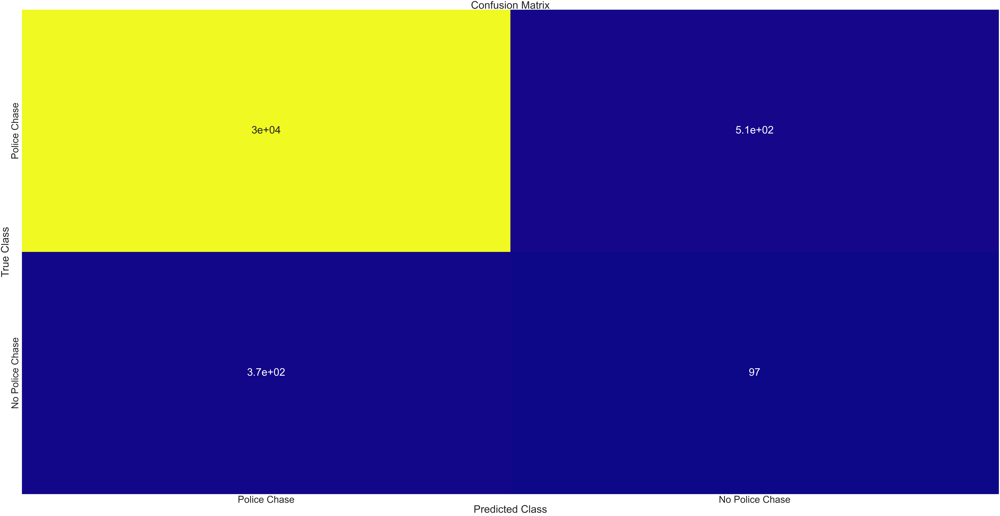

In [143]:
"""Supervised Learning Categorical Bayes Classifier Cell: We want to predict if a cop chase occurrs or not. JR"""

#Most of this came from the BayesClassifier Assignment That Alix and Jennifer Did. Except for the ordinal encoder. 

#Create Vector For What We Are Predicting
predicting = cat_df['A_POLPUR'].to_numpy()

#Going to drop the label from a copy of the dataframe so next model can use the unaltered dataframe
supervised_df = pd.DataFrame(cat_df.copy(deep = True))

#Drop the type label from dataset before building model AR
supervised_df.drop(['A_POLPUR'], axis = 1, inplace = True)

#Convert DataFrame To Numpy Array
cat_numpy = supervised_df.to_numpy()

#Encode Values. Found How To Do This Here.
#https://towardsdatascience.com/naive-bayes-classifier-how-to-successfully-use-it-in-python-ecf76a995069
enc = OrdinalEncoder()
cat_numpy = enc.fit_transform(cat_numpy)

#Split DataFrame Into Test/Train
cat_train, cat_test, label_train, label_test = train_test_split(cat_numpy, predicting, test_size=0.2, random_state=0)

#Create an Instance of CategoricalBayes
cat_nb = CategoricalNB()


#Train the Model
label_predictions = cat_nb.fit(cat_train, label_train).predict(cat_test)

# number of misclassified observations in the test dataset
print("Number of mislabeled points out of a total %d points : %d"
      % (cat_test.shape[0], (label_test != label_predictions).sum()))

#Measures how well the model perform on the test dataset

print("\n\nModel score: ")
print(cat_nb.score(cat_test, label_test))

#Cross Validate
#10 Fold Cross Validation
cross_validate(cat_nb, cat_test, label_test, return_train_score= True)

accuracy = cross_val_score(cat_nb, cat_test, label_test, scoring='accuracy', cv = 10)

print(accuracy)

#Confusion Matrix AR
#Calls the confusion matrix function
label_head = ['Police Chase', 'No Police Chase']
matrix = confusion_matrix(label_test, label_predictions)

dataframeVisual = pd.DataFrame(matrix, index = label_head, columns = label_head)

#Visualize Confusion Matrix AR
plt.figure(figsize=(100,50))
sns.heatmap(dataframeVisual, annot = True, cbar = None, cmap = 'plasma')
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show



Text(0.5, 0, 'Accuracy')

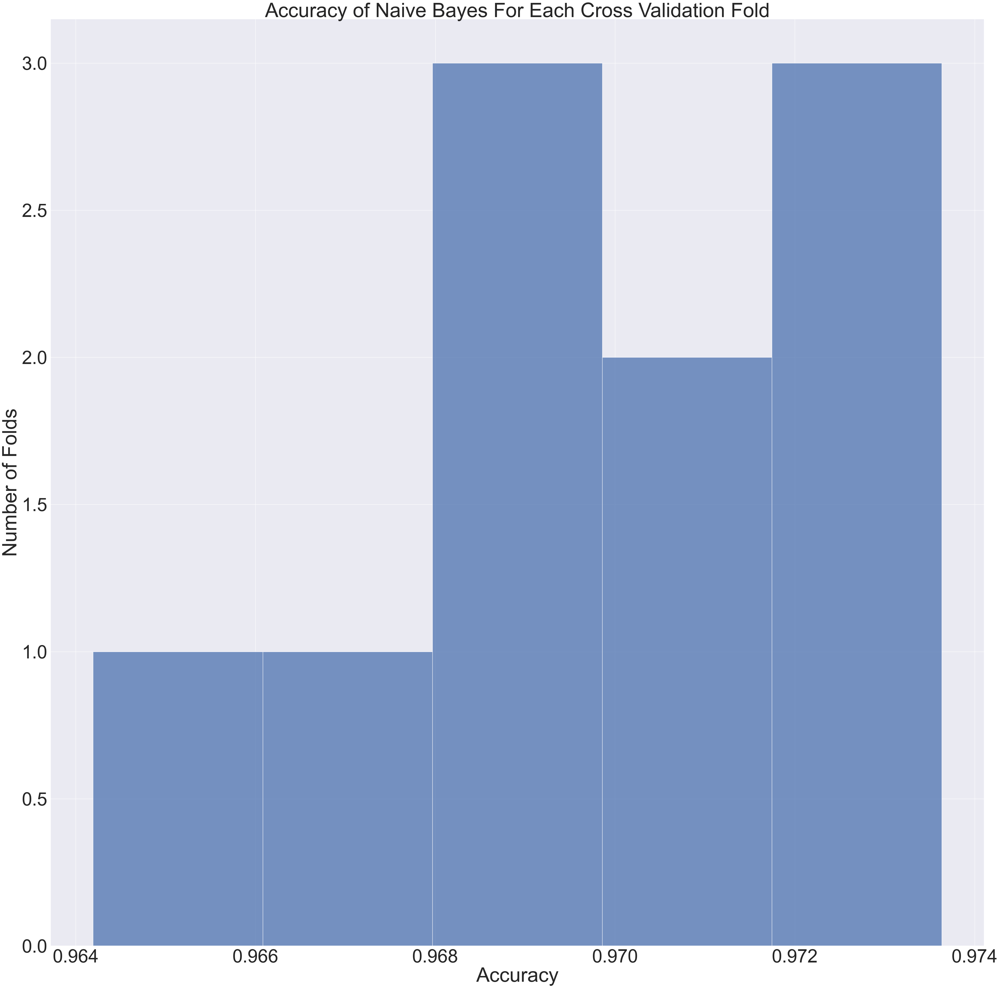

In [144]:
"""Graph For Naive Bayes Evaluation Metrics AR """

sns.set(font_scale = 5)
plt.figure(figsize=(50,50))
plt.title("Accuracy of Naive Bayes For Each Cross Validation Fold")
sns.histplot(data = accuracy)
plt.ylabel('Number of Folds')
plt.xlabel('Accuracy')

# Clustering (Unsupervised Learning) JR

* Using KModes clustering, we will see under what conditions the most pedestrian fatalities occur. The KModes algorithm uses the total of mismatches between the data points. The data points are more similar when there are less dissimilarities. We used 10 fold cross to measure our model. This cluster model shows all of the rows that are similar but in different regions. Only one of these models contain pedestrians in it but we believe it is due to fact that there are only a few pedestrians that are involved in fatal car accidents.

* The elbow method is measure optimal k. When the number of clusters increase the number of cost decrease. When the number of clusters hit 2 then the rate of change is less steep and there's a slight change when the number of clusters hit 3. The point where the "elbow" is a good indicator that the point is the best fits for the model. It looks like the model we used fits best at 3 cluster at an approximate cost of 1.53. OPtimal number of clusters help determine the number of cluster to fit in the model for a certain range of values.

[['FL' 'AL, FL, GA, SC, TN' 'Urban' 'Principal arterial, other' 'Angle'
  'Daytime' 'Weekday' 'Two Vehicle' 'Clear' 'No Large Truck Involved'
  'No Motorcycle Involved' 'No Police Pursuit' 'Not a Hit and Run'
  'Not On Indian Reservation' 'Passenger Car' 'Front' 'Valid' 'Valid'
  'Not Valid' 'Not Applicable' 'Other Body Type' 'No Fire'
  '25 - 34 Yrs Old' 'Driver' 'Used Seatbelt' 'Did Not Use Helmet' 'White'
  'Not Ejected' 'Survived' 'Occupant of Vehicle' 'Not Drowsy'
  'Not Speeding' 'Not Distracted' 'No Rollover' 'No Drunk Driver'
  'Intersection Crash' 'Not a Pedestrian Fatality']
 ['TX' 'AR, IA, KS, NE, MO' 'Rural' 'Collector'
  'Collision With Stopped Vehicle' 'Nighttime' 'Weekend' 'Single Vehicle'
  'Clear' 'No Large Truck Involved' 'No Motorcycle Involved'
  'No Police Pursuit' 'Not a Hit and Run' 'Not On Indian Reservation'
  'Passenger Car' 'Front' 'Valid' 'Valid' 'Not Valid' 'Not Applicable'
  'Other Body Type' 'No Fire' '25 - 34 Yrs Old' 'Driver'
  'Did Not Use Seatbelt' 'D

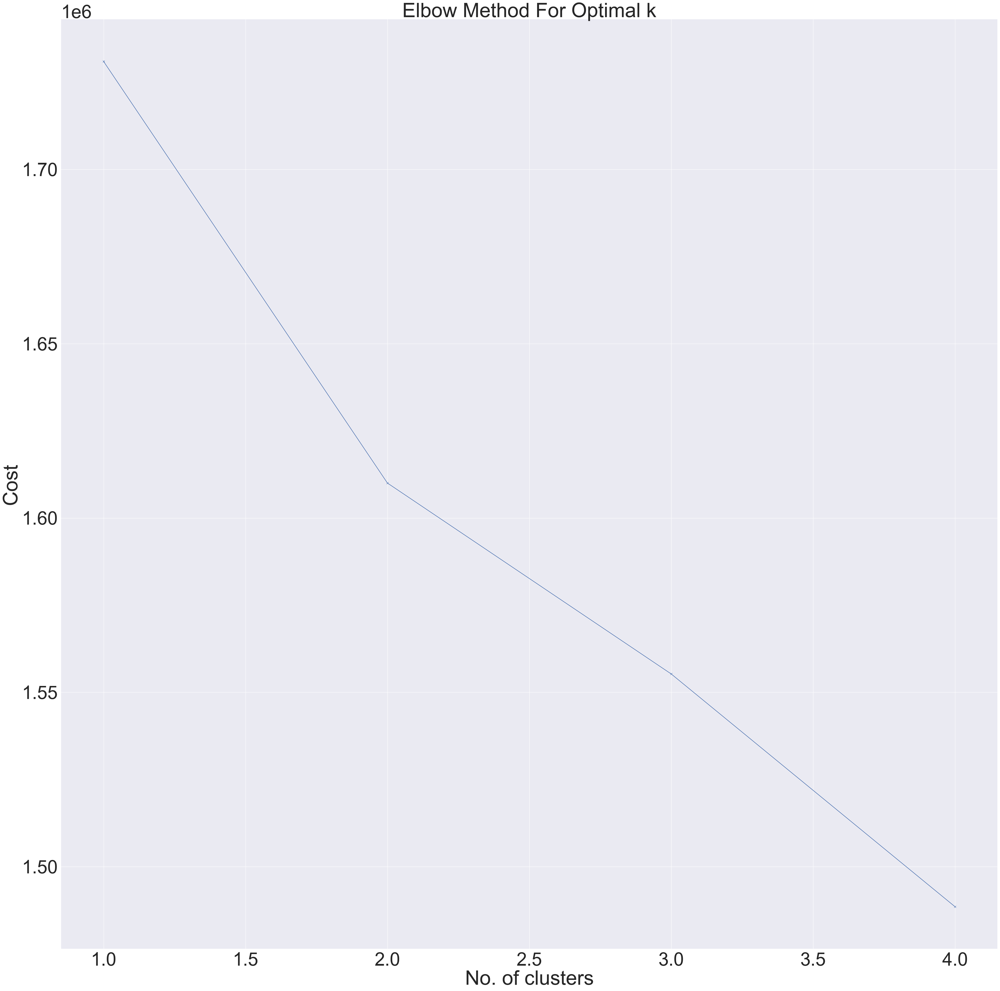

In [145]:
"""Unsupervised Learning: KModes Clustering Algorithm: We want to learn under what conditions the most pedestrian fatalities occur AR"""
#Found this in the API Here
#https://pypi.org/project/kmodes/#citation-reference-2

#Make a copy before dropping.
cat_copy_df = pd.DataFrame(cat_df.copy(deep = True))

#Create Vector For What We Are Predicting
unsup_predicting = cat_df['Pedestrian Fatalities'].to_numpy()

#Drop the type label from dataset before building model AR
cat_copy_df.drop(['Pedestrian Fatalities'], axis = 1, inplace = True)

#Convert DataFrame To Numpy Array
unsup_cat_numpy = cat_copy_df.to_numpy()

#Split DataFrame Into Test/Train
uncat_train, uncat_test, unsup_label_train, unsup_label_test = train_test_split(unsup_cat_numpy, unsup_predicting, test_size=0.2, random_state=0)

#Create KModes Instance
km = KModes()

#Create the Model
clusters = km.fit_predict(cat_df)

#Cross Validate
#10 Fold Cross Validation AR
cross_validate(km, uncat_test, unsup_label_test, scoring = 'adjusted_mutual_info_score') 


print(km.cluster_centroids_)

# Elbow curve to find optimal K
cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(cat_df)
    cost.append(kmode.cost_)
    
plt.figure(figsize=(50,50))
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

STATE  A_REGION                    A_RU   A_ROADFC                   A_MANCOL                        A_TOD      A_DOW    A_CT                    A_WEATHER  A_LT                     A_MC                    A_POLPUR           A_HR               INDIAN_RES                 A_BODY                 A_IMP1  A_LIC_S  A_LIC_C  A_CDL_S    A_MC_L_S        A_SBUS                A_FIRE_EXP  A_AGE6                A_PTYPE       A_RESTUSE             A_HELMUSE           A_HRACE  A_EJECT      A_PERINJ         A_LOC                   Drowsy Drivers  Speeding Drivers  Distracted Drivers  Vehicle Rollovers  Drunk Drivers    Crash Locations         Pedestrian Fatalities    
CO     CO, NV, ND, SD, WY, UT      Urban  Minor arterial             Sideswipe                       Daytime    Weekday  More Than Two Vehicles  Clear      Large Truck Involved     No Motorcycle Involved  No Police Pursuit  Not a Hit and Run  Not On Indian Reservation  Passenger Car          Rear    Valid    Valid    Not Valid  Not Appli

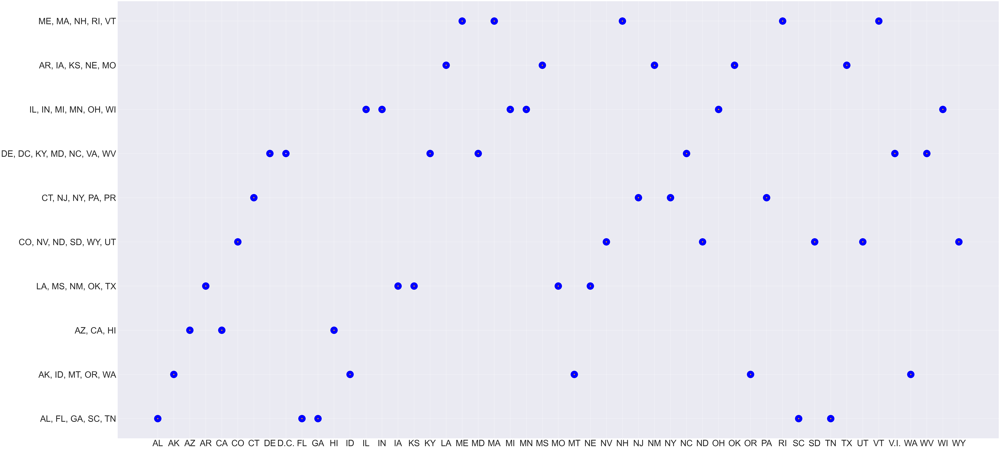

In [170]:
"""Graph For K-Modes Evaluation AMR"""
#There are 7 clusters. 



#Labels
label_0 = cat_df[clusters == 0]
label_1 = cat_df[clusters == 1]
label_2 = cat_df[clusters == 2]
label_3 = cat_df[clusters == 3]
label_4 = cat_df[clusters == 4]
label_5 = cat_df[clusters == 5]
label_6 = cat_df[clusters == 6]

cols = label_0.columns
cols2 = label_1.columns

print(label_0.value_counts())
#print(label_0.columns)
print(label_1.value_counts())
#print(label_1.columns)

#Clearly this shows that the clusters are all the same. Either the graph or the model itself is flawed, I am not sure which. I will investigate this later if I have time. 
sns.set(font_scale = 5)
plt.figure(figsize=(100,50))
plt.scatter(label_0[cols[0]], label_0[cols[1]], color = 'red', s = 1000)
plt.scatter(label_1[cols2[0]], label_1[cols2[1]], color = 'black', s = 1000)
plt.scatter(label_2[cols[0]], label_2[cols[1]], color = 'blue', s = 2000)
plt.scatter(label_3[cols[0]], label_3[cols[1]], color = 'purple')
plt.scatter(label_4[cols[0]], label_4[cols[1]], color = 'green')
plt.scatter(label_5[cols[0]], label_5[cols[1]], color = 'pink')
plt.scatter(label_6[cols[0]], label_6[cols[1]], color = 'orange')

plt.show()


# Conclusions JR

* We learned in this project/class how to create models from our dataset. There are different models to use for different reasons and picking the right model will give us the best results. We learned the meaning and use of the different models.

* This project was challenging. It really challenged our thinking and programming abilities. It takes time to get the code to execute the way we want to and to debug every error. We both aren't as experienced with Python so we had to learn while taking this class. Alix is a quick learner and very persistent.

* A few limitations that our projects have is accuracy errors, because we are still learning to program and create graphs we will make little mistakes. There are always room for growth and there is always something that we can do to make our graphs/models better and more accurate. There may be some flaws but we tried our absolute best. I bet if we learned more on how to code the models then our model would be more accurate. I am proud of how this project came out and how hardworking we were for our project.

* Bayes Classifier, Confusion Matrix, KModes, Cross Validation and Elbow are all algorithms that we used for this project. The algorithms are used for specific kind of reason, for example, predicting categorical varibale we used the bayes classifier.

* I would like to see the difference in fatal car accidents change throughout the future years and compare to them. I would like to see the total numbers decrease in fatal car accidents. There will always be disasters around the corner but I would like to see less in this world.

# References and Citations JR
Information about the fancy impute library
https://pypi.org/project/fancyimpute/

Information about K Nearest Neighbors Imputation
https://towardsdatascience.com/preprocessing-encode-and-knn-impute-all-categorical-features-fast-b05f50b4dfaa

Further Information About KNN Imputation Regarding Specifically How to Input NAN Values
https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/#:~:text=Although%20any%20one%20among%20a,as%20%E2%80%9Cnearest%20neighbor%20imputation.%E2%80%9D

Definition of Data Leakage
https://jfrog.com/community/data-science/be-careful-from-data-leakage-2/#:~:text=Data%20leakage%20refers%20to%20a,would%20like%20to%20predict%20on.

Information About Standardization, Scaling and Normalizing of Data
https://towardsdatascience.com/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02#:~:text=StandardScaler%20is%20the%20industry's%20go,values%20by%20the%20standard%20deviation.

Information About Whether To Scale KNN Or Not
https://www.datacamp.com/tutorial/k-nearest-neighbor-classification-scikit-learn

Explains the Fit/Transform Process
https://www.analyticsvidhya.com/blog/2021/04/sklearn-objects-fit-vs-transform-vs-fit_transform-vs-predict-in-scikit-learn/

Information About Dython and How To Generate A Correlation Matrix For Categorical Variables
https://medium.com/@knoldus/how-to-find-correlation-value-of-categorical-variables-23de7e7a9e26

Information About KModes Clustering Algorithm
https://www.analyticsvidhya.com/blog/2021/06/kmodes-clustering-algorithm-for-categorical-data/

https://github.com/nicodv/kmodes/blob/master/kmodes/kmodes.py

Information About Feature Engineering
https://www.analyticsvidhya.com/blog/2020/10/getting-started-with-feature-engineering/#:~:text=Feature%20engineering%20is%20a%20process,performance%20of%20machine%20learning%20algorithms.

Why I Didn't Use One Hot Encoding For Bayes
https://towardsdatascience.com/naive-bayes-classifier-how-to-successfully-use-it-in-python-ecf76a995069

Information About Graphing Naive Bayes Results Better (If I have time)
https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_predict.html#sphx-glr-auto-examples-model-selection-plot-cv-predict-py

Information About Graphing K Modes Clusters
https://www.askpython.com/python/examples/plot-k-means-clusters-python